<a href="https://colab.research.google.com/github/Ashish-Tripathy/Yolo-training-GunDetection/blob/master/YOLO_Gun_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
!git clone https://github.com/Ashish-Tripathy/Yolo-training-GunDetection.git

Cloning into 'Yolo-training-GunDetection'...
remote: Enumerating objects: 1256, done.
remote: Counting objects: 100% (1256/1256), done.
remote: Compressing objects: 100% (824/824), done.
remote: Total 1542 (delta 444), reused 1234 (delta 427), pack-reused 286
Receiving objects: 100% (1542/1542), 181.25 MiB | 12.64 MiB/s, done.
Resolving deltas: 100% (444/444), done.


In [0]:
!git clone https://github.com/AlexeyAB/darknet/

Cloning into 'darknet'...
remote: Enumerating objects: 12449, done.
remote: Total 12449 (delta 0), reused 0 (delta 0), pack-reused 12449
Receiving objects: 100% (12449/12449), 11.38 MiB | 2.29 MiB/s, done.
Resolving deltas: 100% (8492/8492), done.


In [0]:
!apt-get install build-essential
!apt-get install cmake git libgtk2.0-dev pkg-config libavcodec-dev libavformat-dev libswscale-dev
!apt-get install libavcodec-dev libavformat-dev
!apt-get -y install cmake
!which cmake
!apt-get install libopencv-dev
!apt-get install vim

!cmake --version

Reading package lists... Done
Building dependency tree       
Reading state information... Done
build-essential is already the newest version (12.4ubuntu1).
The following package was automatically installed and is no longer required:
  libnvidia-common-430
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 25 not upgraded.
Reading package lists... Done
Building dependency tree       
Reading state information... Done
pkg-config is already the newest version (0.29.1-0ubuntu2).
cmake is already the newest version (3.10.2-1ubuntu2.18.04.1).
git is already the newest version (1:2.17.1-1ubuntu0.5).
libavcodec-dev is already the newest version (7:3.4.6-0ubuntu0.18.04.1).
libavcodec-dev set to manually installed.
libavformat-dev is already the newest version (7:3.4.6-0ubuntu0.18.04.1).
libavformat-dev set to manually installed.
libswscale-dev is already the newest version (7:3.4.6-0ubuntu0.18.04.1).
libswscale-dev set to manually installed.
The following package

In [0]:
!ls
import sys
sys.path.insert(1, './Yolo-training-GunDetection/')

darknet  gdrive  sample_data  scarface.mp4  Yolo-training-GunDetection


In [0]:
!ls

In [0]:
#Now here we're modifying the makefile to set OPENCV and GPU to 1
!ls
!sed -i 's/OPENCV=0/OPENCV=1/g' ./darknet/Makefile
!sed -i 's/GPU=0/GPU=1/g' ./darknet/Makefile

darknet  gdrive  sample_data  scarface.mp4  Yolo-training-GunDetection


In [0]:
!ls
%cd ../
!ls

darknet  gdrive  sample_data  scarface.mp4  Yolo-training-GunDetection
/
bin					   etc	  opt	 sys
boot					   home   proc	 tensorflow-2.1.0
content					   lib	  root	 tmp
datalab					   lib32  run	 tools
dev					   lib64  sbin	 usr
dlib-19.18.0-cp27-cp27mu-linux_x86_64.whl  media  srv	 var
dlib-19.18.0-cp36-cp36m-linux_x86_64.whl   mnt	  swift


In [0]:
!apt install g++-5
!apt install gcc-5

!update-alternatives --install /usr/bin/gcc gcc /usr/bin/gcc-5 10
!update-alternatives --install /usr/bin/gcc gcc /usr/bin/gcc-5 20
!update-alternatives --install /usr/bin/g++ g++ /usr/bin/g++-5 10
!update-alternatives --install /usr/bin/g++ g++ /usr/bin/g++-5 20
!update-alternatives --install /usr/bin/cc cc /usr/bin/gcc 30
!update-alternatives --set cc /usr/bin/gcc
!update-alternatives --install /usr/bin/c++ c++ /usr/bin/g++ 30
!update-alternatives --set c++ /usr/bin/g++

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-430
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  cpp-5 gcc-5 gcc-5-base libasan2 libgcc-5-dev libisl15 libmpx0
  libstdc++-5-dev
Suggested packages:
  gcc-5-locales g++-5-multilib gcc-5-doc libstdc++6-5-dbg gcc-5-multilib
  libgcc1-dbg libgomp1-dbg libitm1-dbg libatomic1-dbg libasan2-dbg
  liblsan0-dbg libtsan0-dbg libubsan0-dbg libcilkrts5-dbg libmpx0-dbg
  libquadmath0-dbg libstdc++-5-doc
The following NEW packages will be installed:
  cpp-5 g++-5 gcc-5 gcc-5-base libasan2 libgcc-5-dev libisl15 libmpx0
  libstdc++-5-dev
0 upgraded, 9 newly installed, 0 to remove and 25 not upgraded.
Need to get 29.1 MB of archives.
After this operation, 100 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 gcc-5-bas

In [0]:
#Now, here's a bunch of code that takes the longest to execute here but
#It's about installing CUDA and using the beautiful Tesla K80 GPU, so that
#Will worth it

!apt update -qq;
!wget https://developer.nvidia.com/compute/cuda/8.0/Prod2/local_installers/cuda-repo-ubuntu1604-8-0-local-ga2_8.0.61-1_amd64-deb
!dpkg -i cuda-repo-ubuntu1604-8-0-local-ga2_8.0.61-1_amd64-deb
!apt-get update -qq

#Here were are installing compilers and creating some links
!apt-get install cuda -y -qq #gcc-5 g++-5 
#!ln -s /usr/bin/gcc-5 /usr/local/cuda/bin/gcc
#!ln -s /usr/bin/g++-5 /usr/local/cuda/bin/g++
!apt update
!apt upgrade
!apt install cuda-8.0 -y

93 packages can be upgraded. Run 'apt list --upgradable' to see them.
--2020-02-16 09:43:16--  https://developer.nvidia.com/compute/cuda/8.0/Prod2/local_installers/cuda-repo-ubuntu1604-8-0-local-ga2_8.0.61-1_amd64-deb
Resolving developer.nvidia.com (developer.nvidia.com)... 192.229.189.146
Connecting to developer.nvidia.com (developer.nvidia.com)|192.229.189.146|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://developer.download.nvidia.com/compute/cuda/8.0/secure/Prod2/local_installers/cuda-repo-ubuntu1604-8-0-local-ga2_8.0.61-1_amd64.deb?WXVvHG6wySpb8VXAgyTt1N3JFCHiYHoeP32l62k5mvYHO8uUFBSc5Kq8rLKjJumo1lVquzq0vreEALZvUrhjOWUIufY65vPovIamH1Ui_jzpGI4kIY-G1u8Ux1jLlNZ0EWcPsTmRZDxIu-ghbOvi-pKsgWIa7kaimnpLbGU5T_LgfRB1oh5uLHXUKTJtnycynm2comfDEueTUmPc8XsbQTbXWA [following]
--2020-02-16 09:43:17--  https://developer.download.nvidia.com/compute/cuda/8.0/secure/Prod2/local_installers/cuda-repo-ubuntu1604-8-0-local-ga2_8.0.61-1_amd64.deb?WXVvHG6wySpb8VXAgyTt1N

In [0]:
#Now let's see whether the GPU is here and CUDA was successfully installed!
import tensorflow as tf
device_name = tf.test.gpu_device_name()
print(device_name)

print("'sup!'")

!/usr/local/cuda/bin/nvcc --version

/device:GPU:0
'sup!'
nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2016 NVIDIA Corporation
Built on Tue_Jan_10_13:22:03_CST_2017
Cuda compilation tools, release 8.0, V8.0.61


In [0]:
ls

In [0]:
%cd ../content

/content


In [0]:
!ls

In [0]:
%cd darknet/

/content/darknet


In [0]:
!ls
!make -j 2

3rdparty      cmake		      image_yolov2.sh	     net_cam_v3.sh
appveyor.yml  CMakeLists.txt	      image_yolov3.sh	     README.md
build	      DarknetConfig.cmake.in  include		     scripts
build.ps1     darknet.py	      json_mjpeg_streams.sh  src
build.sh      darknet_video.py	      LICENSE		     video_v2.sh
cfg	      data		      Makefile		     video_yolov3.sh
mkdir -p ./obj/
mkdir -p backup
mkdir -p results
chmod +x *.sh
g++ -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -Ofast -DOPENCV -DGPU -c ./src/image_opencv.cpp -o obj/image_opencv.o
g++ -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -Ofast -DOPENCV -DGPU -c ./src/http_stream.cpp -o obj/http_stream.o
In file included from ./src/http_stream.cpp:576:0:
./src/httplib.

In [0]:
!ls

3rdparty      cmake		      image_yolov2.sh	     obj
appveyor.yml  CMakeLists.txt	      image_yolov3.sh	     README.md
backup	      darknet		      include		     results
build	      DarknetConfig.cmake.in  json_mjpeg_streams.sh  scripts
build.ps1     darknet.py	      LICENSE		     src
build.sh      darknet_video.py	      Makefile		     video_v2.sh
cfg	      data		      net_cam_v3.sh	     video_yolov3.sh


In [0]:
#Let's define some functions that will let us show images, and upload and 
#download files
def imShow(path):
  import cv2
  import matplotlib.pyplot as plt
  %matplotlib inline

  image = cv2.imread(path)
  height, width = image.shape[:2]
  resized_image = cv2.resize(image,(3*width, 3*height), interpolation = cv2.INTER_CUBIC)

  fig = plt.gcf()
  fig.set_size_inches(18, 10)
  plt.axis("off")
  #plt.rcParams['figure.figsize'] = [10, 5]
  plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
  plt.show()
  
  
def upload():
  from google.colab import files
  uploaded = files.upload() 
  for name, data in uploaded.items():
    with open(name, 'wb') as f:
      f.write(data)
      print ('saved file', name)
def download(path):
  from google.colab import files
  files.download(path)

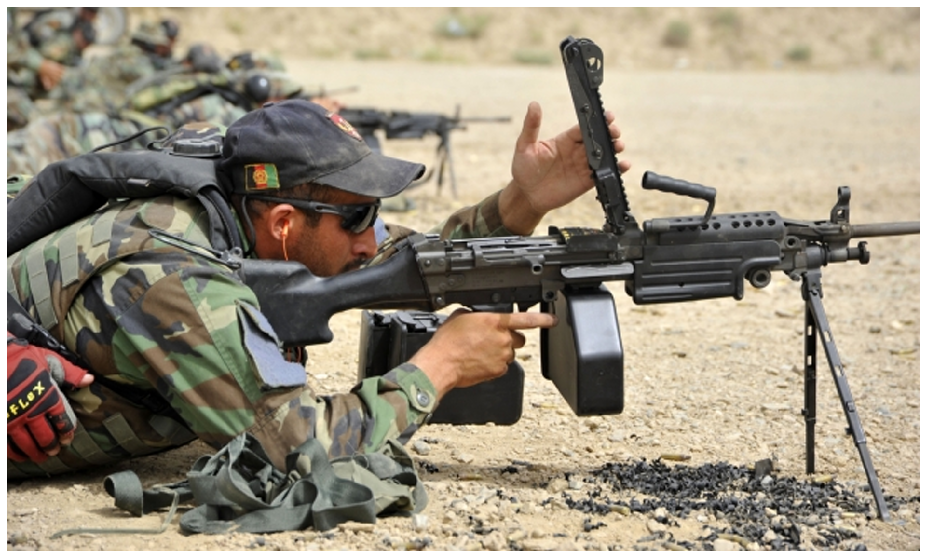

In [0]:
imShow('../Yolo-training-GunDetection/test.jpg')

In [0]:
!ls

In [0]:
!mv ../Yolo-training-GunDetection/data_for_colab/ .

In [0]:
!./darknet detector train data_for_colab/obj.data data_for_colab/yolov3-tiny-obj.cfg data_for_colab/yolov3-tiny.conv.15 -dont_show -map

Streaming output truncated to the last 5000 lines.
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 23 Avg (IOU: -nan, GIOU: -nan), Class: -nan, Obj: -nan, No Obj: 0.082599, .5R: -nan, .75R: -nan, count: 0, class_loss = 29.175608, iou_loss = 0.000000, total_loss = 29.175608 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 16 Avg (IOU: 0.015759, GIOU: -0.000739), Class: 0.576192, Obj: 0.117783, No Obj: 0.100652, .5R: 0.000000, .75R: 0.000000, count: 19, class_loss = 12.897100, iou_loss = 25.612669, total_loss = 38.509769 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 23 Avg (IOU: -nan, GIOU: -nan), Class: -nan, Obj: -nan, No Obj: 0.083846, .5R: -nan, .75R: -nan, count: 0, class_loss = 30.625620, iou_loss = 0.000000, total_loss = 30.625620 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 16 Avg (IOU: 0.004620, GIOU: 0.004620), Class: 0.582327, Obj: 0.114698, No Obj: 0.101276, .5R: 0.000000, .75R: 0.000000, count: 17, class_loss = 13.235060, iou_loss = 29.

In [0]:
!ls

In [0]:
!cp -r backup/ /content/gdrive/My\ Drive/gun_detection/backup/

In [0]:
!./darknet detector test data_for_colab/obj.data data_for_colab/yolov3-tiny-obj.cfg /content/gdrive/My\ Drive/yolov3-tiny-obj_best.weights /content/Yolo-training-GunDetection/test.jpg -i 0 -thresh 0.5

 CUDA-version: 8000 (10010), GPU count: 1  
 OpenCV version: 3.2.0
net.optimized_memory = 0 
batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     16       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  16 0.150 BF
   1 max                2x 2/ 2    416 x 416 x  16 ->  208 x 208 x  16 0.003 BF
   2 conv     32       3 x 3/ 1    208 x 208 x  16 ->  208 x 208 x  32 0.399 BF
   3 max                2x 2/ 2    208 x 208 x  32 ->  104 x 104 x  32 0.001 BF
   4 conv     64       3 x 3/ 1    104 x 104 x  32 ->  104 x 104 x  64 0.399 BF
   5 max                2x 2/ 2    104 x 104 x  64 ->   52 x  52 x  64 0.001 BF
   6 conv    128       3 x 3/ 1     52 x  52 x  64 ->   52 x  52 x 128 0.399 BF
   7 max                2x 2/ 2     52 x  52 x 128 ->   26 x  26 x 128 0.000 BF
   8 conv    256       3 x 3/ 1     26 x  26 x 128 ->   26 x  26 x 256 0.399 BF
   9 max                2x 2/ 2     26 x  26 x 256 ->   13 x  13 x 256 0.000 BF
 

In [0]:
!./darknet detector test data_for_colab/obj.data data_for_colab/yolov3-tiny-obj.cfg backup/yolov3-tiny-obj_last.weights ../Yolo-Training-GoogleColab/test.jpg -i 0 -thresh 0.5

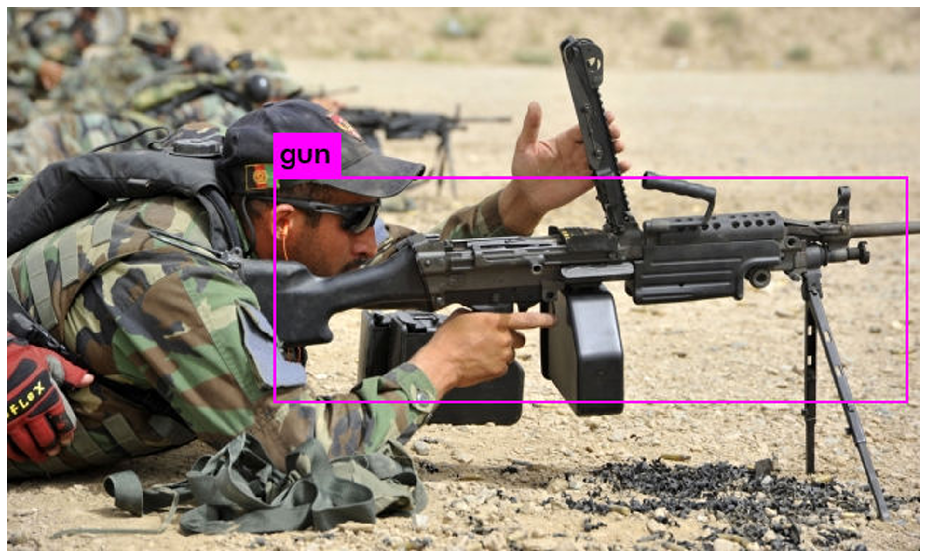

In [0]:
imShow('predictions.jpg')

In [0]:
!./darknet detector test data_for_colab/obj.data data_for_colab/yolov3-tiny-obj.cfg backup/yolov3-tiny-obj_last.weights ../Yolo-Training-GoogleColab/test.jpg -i 0 -thresh 0.5
imShow('predictions.jpg')

In [0]:
!./darknet detector test data_for_colab/obj.data data_for_colab/yolov3-tiny-obj.cfg /content/gdrive/My\ Drive/yolov3-tiny-obj_best.weights -dont_show /content/video.mp4 -i 0 -out_filename /content/veout.avi

 CUDA-version: 8000 (10010), GPU count: 1  
 OpenCV version: 3.2.0
net.optimized_memory = 0 
batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     16       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  16 0.150 BF
   1 max                2x 2/ 2    416 x 416 x  16 ->  208 x 208 x  16 0.003 BF
   2 conv     32       3 x 3/ 1    208 x 208 x  16 ->  208 x 208 x  32 0.399 BF
   3 max                2x 2/ 2    208 x 208 x  32 ->  104 x 104 x  32 0.001 BF
   4 conv     64       3 x 3/ 1    104 x 104 x  32 ->  104 x 104 x  64 0.399 BF
   5 max                2x 2/ 2    104 x 104 x  64 ->   52 x  52 x  64 0.001 BF
   6 conv    128       3 x 3/ 1     52 x  52 x  64 ->   52 x  52 x 128 0.399 BF
   7 max                2x 2/ 2     52 x  52 x 128 ->   26 x  26 x 128 0.000 BF
   8 conv    256       3 x 3/ 1     26 x  26 x 128 ->   26 x  26 x 256 0.399 BF
   9 max                2x 2/ 2     26 x  26 x 256 ->   13 x  13 x 256 0.000 BF
 

In [0]:
!./darknet detector demo data_for_colab/obj.data data_for_colab/yolov3-tiny-obj.cfg /content/gdrive/My\ Drive/yolov3-tiny-obj_best.weights  -dont_show video.mp4 -i 0 -out_filename bankRobber.mp4

Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream st

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream st

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream st

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream st

In [0]:
!./darknet detector demo data_for_colab/obj.data data_for_colab/yolov3-tiny-obj.cfg /content/gdrive/My\ Drive/yolov3-tiny-obj_best.weights ../video.mp4 -i 0 -thresh 0.5 -ext_output -dont_show 

In [31]:
!./darknet detector demo data_for_colab/obj.data data_for_colab/yolov3-tiny-obj.cfg /content/gdrive/My\ Drive/yolov3-tiny-obj_last.weights  -dont_show /content/scarface.mp4 -i 0 -out_filename /content/scarfacedet.mp4

Streaming output truncated to the last 5000 lines.

 cvWriteFrame 
Objects:


FPS:99.8 	 AVG_FPS:104.2

 cvWriteFrame 
Objects:


FPS:103.0 	 AVG_FPS:104.2

 cvWriteFrame 
Objects:


FPS:101.1 	 AVG_FPS:104.2

 cvWriteFrame 
Objects:

gun: 28% 

FPS:100.7 	 AVG_FPS:104.2

 cvWriteFrame 
Objects:

gun: 36% 

FPS:98.5 	 AVG_FPS:104.2

 cvWriteFrame 
Objects:

gun: 32% 

FPS:96.7 	 AVG_FPS:104.2

 cvWriteFrame 
Objects:


FPS:95.5 	 AVG_FPS:104.2

 cvWriteFrame 
Objects:


FPS:95.9 	 AVG_FPS:104.2

 cvWriteFrame 
Objects:


FPS:94.9 	 AVG_FPS:104.2

 cvWriteFrame 
Objects:

gun: 46% 

FPS:95.7 	 AVG_FPS:104.2

 cvWriteFrame 
Objects:


FPS:95.6 	 AVG_FPS:104.2

 cvWriteFrame 
Objects:


FPS:94.6 	 AVG_FPS:104.2

 cvWriteFrame 
Objects:


FPS:93.6 	 AVG_FPS:104.2

 cvWriteFrame 
Objects:


FPS:92.8 	 AVG_FPS:104.2

 cvWriteFrame 
Objects:


FPS:92.6 	 AVG_FPS:104.2

 cvWriteFrame 
Objects:


FPS:93.4 	 AVG_FPS:104.2

 cvWriteFrame 
Objects:


FPS:92.3 	 AVG_FPS:104.2

 cvWriteFrame 
Object